## Breast Cancer Dataset: Exploratory Data Analysis (EDA)
## Krishna Dave (UID: 905636874)

###  Description
Breast cancer is a malignant type of cancer and has been life threatening for women around the world. With early detection as a non-metastatic disease, breast cancer is curable. Healthcare datasets such as these are highly confidential, but important for analysis and model training that help with early detection. Therefore, exploring the use cases of synthetic data generation for such a dataset is quite beneficial. 

In this notebook, we perform exploratory data analysis (EDA) on the real dataset as well as the synthetically generated datasets from several sources (including GReaT, OpenAI's GPT4, Mostly.AI) to understand the data quality and data distributions, and compare and contrast
between the real dataset and the synthetically generated ones.

### About the dataset

The raw dataset contains the following columns in the data files including:

1. ID (Patient ID)
2. DIAGNOSIS (M: Malignant, B: Benign)
3. RADIUS1
4. TEXTURE1
5. PERIMETER1
6. AREA1
7. SMOOTHNESS1
8. COMPACTNESS1
9. CONCAVITY1
10. CONCAVE_POINTS1
11. SYMMETRY1
12. FRACTAL_DIMENSION1
13. RADIUS2
14. TEXTURE2
15. PERIMETER2
16. AREA2
17. SMOOTHNESS2
18. COMPACTNESS2
19. CONCAVITY2
20. CONCAVE_POINTS2
21. SYMMETRY2
22. FRACTAL_DIMENSION2
23. RADIUS3
24. TEXTURE3
25. PERIMETER3
26. AREA3
27. SMOOTHNESS3
28. COMPACTNESS3
29. CONCAVITY3
30. CONCAVE_POINTS3
31. SYMMETRY3
32. FRACTAL_DIMENSION3

Attribute Information:
* ID number
* Diagnosis (M = malignant, B = benign)

There ten real-valued features are computed for each cell nucleus:
- a) radius (mean of distances from the center to points on the perimeter)
- b) texture (standard deviation of gray-scale values)
- c) perimeter
- d) area
- e) smoothness (local variation in radius lengths)
- f) compactness (perimeter² / area — 1.0)
- g) concavity (severity of concave portions of the contour)
- h) concave points (number of concave portions of the contour)
- i) symmetry
- j) fractal dimension (“coastline approximation” — 1)

### References/Links
- https://github.com/datamole-ai/edvart
- https://github.com/datamole-ai
- https://datamole-ai.github.io/edvart/
- https://github.com/SouRitra01/Exploratory-Data-Analysis-EDA-in-Banking-Python-Project-/blob/main/Proj1_EDA_Pandas_Banking%20(1).ipynb
- https://www.kaggle.com/code/itsmohammadshahid/eda-breast-cancer-prediction
- https://www.kaggle.com/code/shaunthesheep/breast-cancer-wisconsin-eda
- https://medium.com/@shashmikaranam/exploratory-data-analysis-breast-cancer-wisconsin-diagnostic-dataset-6a3be9525cd
- https://medium.com/analytics-vidhya/breast-cancer-diagnostic-dataset-eda-fa0de80f15bd
- https://www.knowledgehut.com/blog/data-science/eda-data-science
- https://towardsdatascience.com/an-extensive-guide-to-exploratory-data-analysis-ddd99a03199e
- https://www.ibm.com/topics/exploratory-data-analysis
- https://www.geeksforgeeks.org/exploratory-data-analysis-eda-types-and-tools/
- https://www.simplilearn.com/tutorials/data-analytics-tutorial/exploratory-data-analysis

In [1]:
# Installing an open-source Python library for exploratory data analysis
!pip3 install edvart


[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: pip install --upgrade pip


In [2]:
import edvart
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Loads data from the input csvPath, assigns it to appropriate data types and returns a dataframe as data type dictionary
def loadBreastCancerData(csvPath: str):
    # Reads the csv file using the input csvPath
    df = pd.read_csv(csvPath, index_col=None)
    
    # Stores the column names of the DataFrame df in the variable cols
    cols = df.columns
    
    # Uses dictionary comprehension to set the data type of the columns to data types of str or float64
    dtype_dict = {"ID": "str", **{col: 'str' for col in cols[1:3]}, **{col: 'float64' for col in cols[3:]}}
    
    # Applies the data type conversions specified in dtype_dict to the DataFrame df
    # The astype() function is used to cast the columns of the DataFrame to specified data types
    df = df.astype(dtype_dict)
    
    return df

In [4]:
# Paths to the data files
breastCancerData_real = "breastcancer_real_labeled_without_explicit_indices.csv"
breastCancerData_mostlyAI = "breastcancer_synthetic_mostlyAI.csv"
breastCancerData_beGreat = "breastcancer_synthetic_beGreat.csv"
breastCancerData_openAIGPT4 = "breastcancer_synthetic_openai_GPT4_data.csv"

## EDA: Real Dataset

In [5]:
# Checking dimensions and getting more info about the data 
data = loadBreastCancerData(breastCancerData_real)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  569 non-null    object 
 1   DIAGNOSIS           569 non-null    object 
 2   RADIUS1             569 non-null    object 
 3   TEXTURE1            569 non-null    float64
 4   PERIMETER1          569 non-null    float64
 5   AREA1               569 non-null    float64
 6   SMOOTHNESS1         569 non-null    float64
 7   COMPACTNESS1        569 non-null    float64
 8   CONCAVITY1          569 non-null    float64
 9   CONCAVE_POINTS1     569 non-null    float64
 10  SYMMETRY1           569 non-null    float64
 11  FRACTAL_DIMENSION1  569 non-null    float64
 12  RADIUS2             569 non-null    float64
 13  TEXTURE2            569 non-null    float64
 14  PERIMETER2          569 non-null    float64
 15  AREA2               569 non-null    float64
 16  SMOOTHNE

In [7]:
data.head()

,ID,DIAGNOSIS,RADIUS1,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [8]:
data.describe()

,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,SYMMETRY1,FRACTAL_DIMENSION1,RADIUS2,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [9]:
## Unique column values
data.apply(lambda x: len(x.unique())).sort_values(ascending=False).head(10)

ID                    569
SMOOTHNESS2           547
FRACTAL_DIMENSION2    545
AREA3                 544
CONCAVE_POINTS1       542
COMPACTNESS2          541
RADIUS2               540
CONCAVITY3            539
AREA1                 539
COMPACTNESS1          537
dtype: int64

In [11]:
def createEDAReport(data):
    # Calling loadBreastCancerData to load breast cancer data into a data frame
    df = loadBreastCancerData(breastCancerData_real)
    # Create a default report
    report = edvart.DefaultReport(df)
    # Show the report in the current Jupyter notebook
    report.show()
    # Export the report to an HTML file
    report.export_html("report_breastCancerData_real.html")
    # Export the report to a Jupyter notebook
    report.export_notebook("report_breastCancerData_real.ipynb")

# Table of Contents
---

 * [Overview](#9c3efd14-d5a0-4cea-aeaa-0df429fd80e2)

	 * [Quick Info](#5e455652-d668-4b00-8d41-aa1a92a985dd)

	 * [Data Types](#dd3205c5-45f2-42a6-8bb8-6bc9c5997791)

	 * [Data Preview](#f52fc43d-fafc-4296-b0b6-275a6f696c08)

	 * [Missing Values](#c4d1e146-b64c-488c-9a2d-afbb981680bc)

	 * [Rows With Missing Value](#f01a6606-68ed-4c4b-829d-ccf17c76d2cd)

	 * [Constant Occurrence](#61e94637-a291-4f5f-a724-fec01910482c)

	 * [Duplicate Rows](#99ee9c64-241a-447d-96cc-1f7e07b48ac3)

 * [Univariate Analysis](#d4ce7392-5427-4ca1-a387-65b550286fd5)

 * [Bivariate analysis](#be20bf74-0728-4527-842d-774534be6652)

	 * [Correlation Plot](#73c7113e-bbcf-4f28-a28d-792f3cd5e5c5)

	 * [Pairplot](#bfb376ae-e052-4eb6-8250-881c185ded13)

	 * [Contingency table](#3923b779-cbfa-4943-afb5-b76416c5a663)

 * [Multivariate analysis](#2b893847-c50d-433b-b5ba-8c45b36761c8)

	 * [Principal Component Analysis](#7d710b88-a4da-4d91-aa2a-5ccc317dfebe)

	 * [Parallel coordinates](#dc917f13-ccd7-41c6-bb79-c1b411628adf)

	 * [Parallel categories](#298e7848-5c30-404e-a667-dd8dc23a9aad)


# Overview<a id='9c3efd14-d5a0-4cea-aeaa-0df429fd80e2'>
---

## Quick Info<a id='5e455652-d668-4b00-8d41-aa1a92a985dd'>

,
Rows,569
Columns,32
Missing cells,0 (0.00 %)
Zeros,78 (0.43 %)
Duplicate rows,0 (0.00 %)


## Data Types<a id='dd3205c5-45f2-42a6-8bb8-6bc9c5997791'>

Column Name,Inferred Data Type
ID,unique
DIAGNOSIS,categorical
RADIUS1,categorical
TEXTURE1,numeric
PERIMETER1,numeric
AREA1,numeric
SMOOTHNESS1,numeric
COMPACTNESS1,numeric
CONCAVITY1,numeric
CONCAVE_POINTS1,numeric


## Data Preview<a id='f52fc43d-fafc-4296-b0b6-275a6f696c08'>

### First rows

,ID,DIAGNOSIS,RADIUS1,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### Last rows

,ID,DIAGNOSIS,RADIUS1,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.6,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.6,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039


### Sample

,ID,DIAGNOSIS,RADIUS1,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
335,89742801,M,17.06,21.00,111.80,918.6,0.11190,0.10560,0.15080,0.099340,...,20.99,33.15,143.20,1362.0,0.1449,0.20530,0.392000,0.182700,0.2623,0.07599
80,861103,B,11.45,20.97,73.81,401.5,0.11020,0.09362,0.04591,0.022330,...,13.11,32.16,84.53,525.1,0.1557,0.16760,0.175500,0.061270,0.2762,0.08851
285,8912521,B,12.58,18.40,79.83,489.0,0.08393,0.04216,0.00186,0.002924,...,13.50,23.08,85.56,564.1,0.1038,0.06624,0.005579,0.008772,0.2505,0.06431
238,883270,B,14.22,27.85,92.55,623.9,0.08223,0.10390,0.11030,0.044080,...,15.75,40.54,102.50,764.0,0.1081,0.24260,0.306400,0.082190,0.1890,0.07796
211,8810528,B,11.84,18.94,75.51,428.0,0.08871,0.06900,0.02669,0.013930,...,13.30,24.99,85.22,546.3,0.1280,0.18800,0.147100,0.069130,0.2535,0.07993


## Missing Values<a id='c4d1e146-b64c-488c-9a2d-afbb981680bc'>

There are no missing values


## Rows With Missing Value<a id='f01a6606-68ed-4c4b-829d-ccf17c76d2cd'>

There are no missing values


## Constant Occurrence<a id='61e94637-a291-4f5f-a724-fec01910482c'>

Column Name,0 Count,0 %
CONCAVITY1,13,2.285
CONCAVITY3,13,2.285
CONCAVE_POINTS2,13,2.285
CONCAVE_POINTS1,13,2.285
CONCAVITY2,13,2.285
CONCAVE_POINTS3,13,2.285
COMPACTNESS3,0,0.000
SMOOTHNESS3,0,0.000
AREA3,0,0.000
COMPACTNESS2,0,0.000


## Duplicate Rows<a id='99ee9c64-241a-447d-96cc-1f7e07b48ac3'>

There are no duplicated rows


# Univariate Analysis<a id='d4ce7392-5427-4ca1-a387-65b550286fd5'>
---

## *ID - unique*

Each value in the column is unique.

---

## *DIAGNOSIS - categorical*

,
B,357 (62.74 %)
M,212 (37.26 %)
Other values count,0 (0.00 %)
Null,0 (0.00 %)


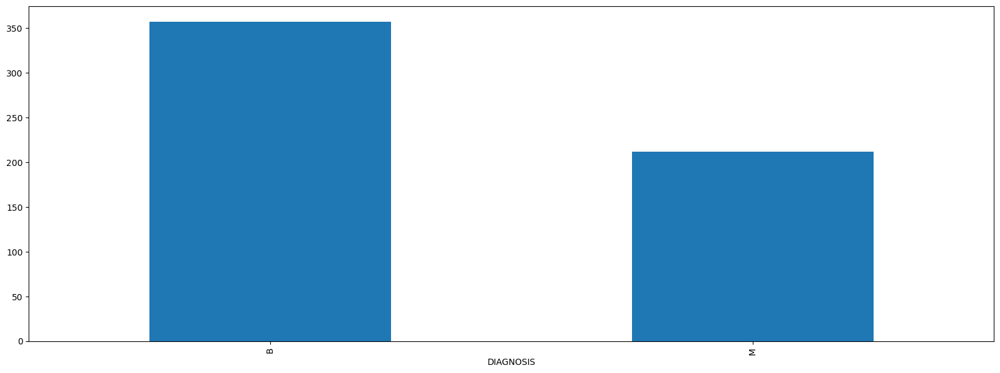

---

## *RADIUS1 - categorical*

,
12.34,4 (0.70 %)
11.71,3 (0.53 %)
12.46,3 (0.53 %)
13.05,3 (0.53 %)
10.26,3 (0.53 %)
Other values count,553 (97.19 %)
Null,0 (0.00 %)


Number of unique values is greater than 50, not plotting bar plot.

---

## *TEXTURE1 - numeric*

,
Number of unique values,479
Sum,10 975.81
Mean,19.29
Mode,14.93
Standard deviation,4.30
Mean absolute deviation,3.38
Median absolute deviation,2.78
Coefficient of variation,0.22
Kurtosis,0.74
Skewness,0.65


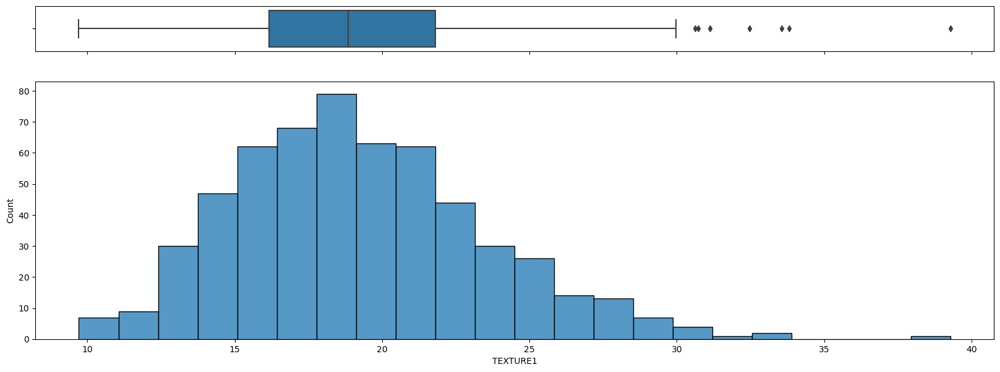

---

## *PERIMETER1 - numeric*

,
Number of unique values,522
Sum,52 330.38
Mean,91.97
Mode,82.61
Standard deviation,24.30
Mean absolute deviation,19.03
Median absolute deviation,15.77
Coefficient of variation,0.26
Kurtosis,0.95
Skewness,0.99


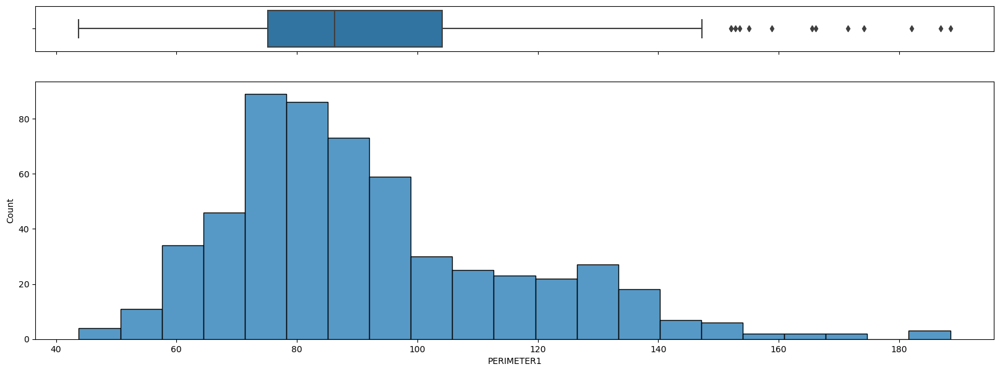

---

## *AREA1 - numeric*

,
Number of unique values,539
Sum,372 631.90
Mean,654.89
Mode,512.20
Standard deviation,351.91
Mean absolute deviation,263.48
Median absolute deviation,217.29
Coefficient of variation,0.54
Kurtosis,3.61
Skewness,1.64


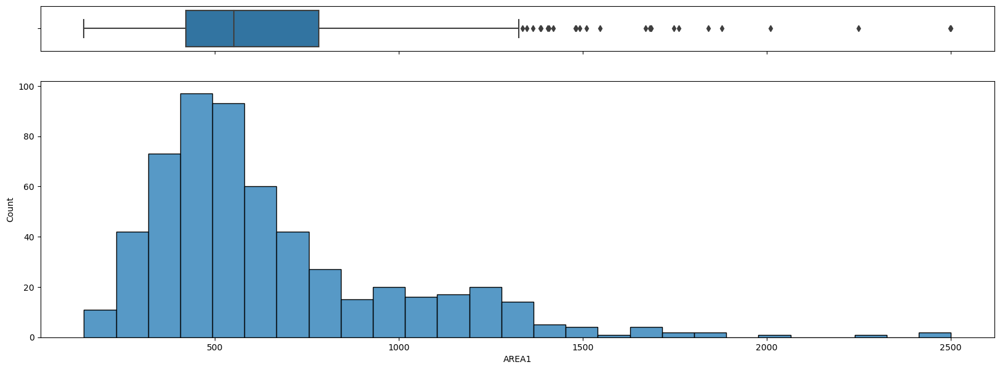

---

## *SMOOTHNESS1 - numeric*

,
Number of unique values,474
Sum,54.83
Mean,0.10
Mode,0.10
Standard deviation,0.01
Mean absolute deviation,0.01
Median absolute deviation,0.01
Coefficient of variation,0.15
Kurtosis,0.84
Skewness,0.46


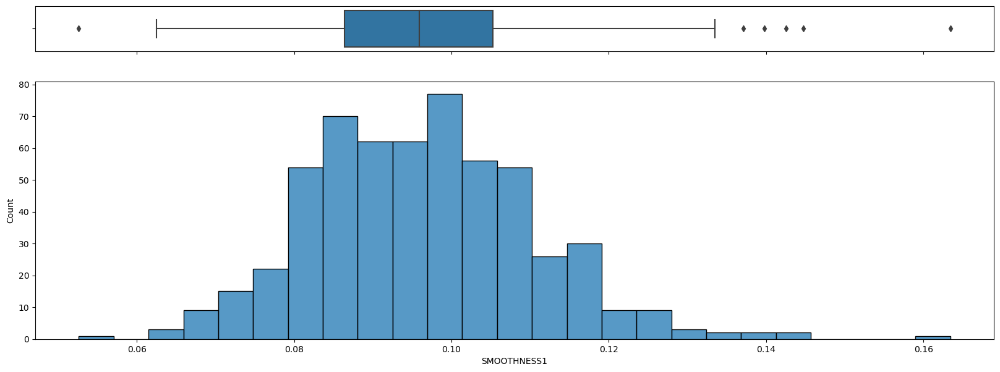

---

## *COMPACTNESS1 - numeric*

,
Number of unique values,537
Sum,59.37
Mean,0.10
Mode,0.11
Standard deviation,0.05
Mean absolute deviation,0.04
Median absolute deviation,0.03
Coefficient of variation,0.51
Kurtosis,1.63
Skewness,1.19


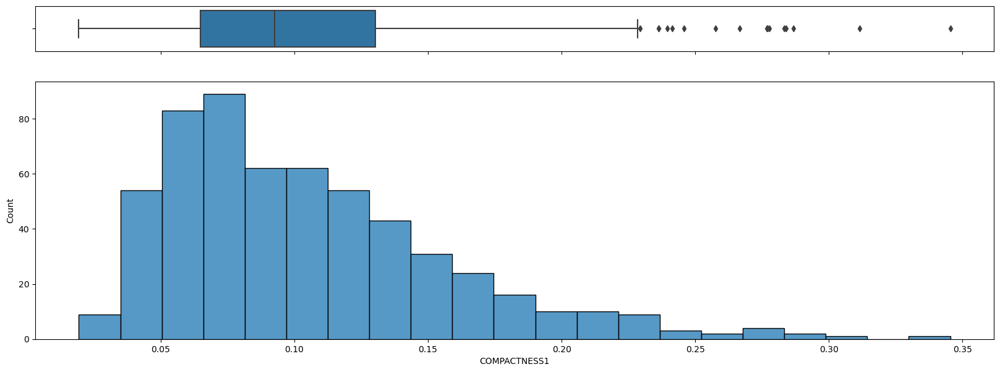

---

## *CONCAVITY1 - numeric*

,
Number of unique values,537
Sum,50.53
Mean,0.09
Mode,0.0
Standard deviation,0.08
Mean absolute deviation,0.06
Median absolute deviation,0.06
Coefficient of variation,0.90
Kurtosis,1.97
Skewness,1.40


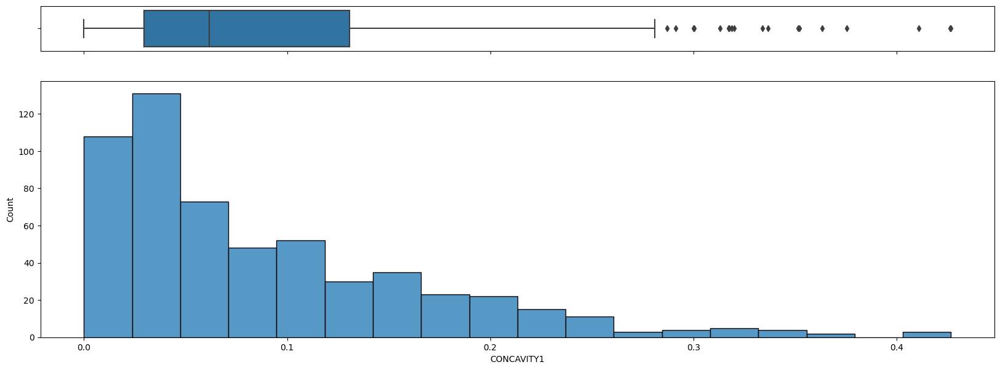

---

## *CONCAVE_POINTS1 - numeric*

,
Number of unique values,542
Sum,27.83
Mean,0.05
Mode,0.0
Standard deviation,0.04
Mean absolute deviation,0.03
Median absolute deviation,0.03
Coefficient of variation,0.79
Kurtosis,1.05
Skewness,1.17


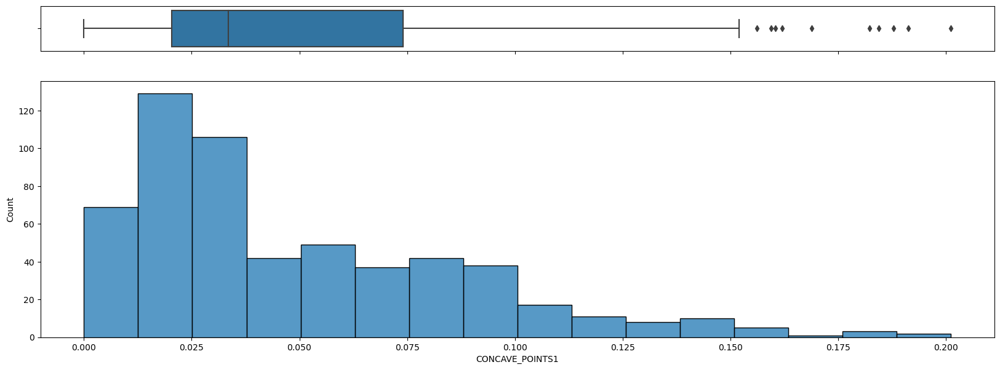

---

## *SYMMETRY1 - numeric*

,
Number of unique values,432
Sum,103.08
Mean,0.18
Mode,0.16
Standard deviation,0.03
Mean absolute deviation,0.02
Median absolute deviation,0.02
Coefficient of variation,0.15
Kurtosis,1.27
Skewness,0.72


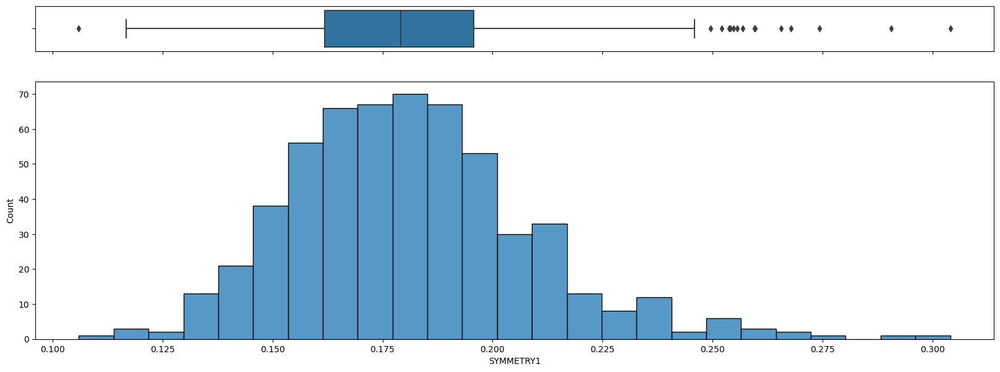

---

## *FRACTAL_DIMENSION1 - numeric*

,
Number of unique values,499
Sum,35.73
Mean,0.06
Mode,0.06
Standard deviation,0.01
Mean absolute deviation,0.01
Median absolute deviation,0.00
Coefficient of variation,0.11
Kurtosis,2.97
Skewness,1.30


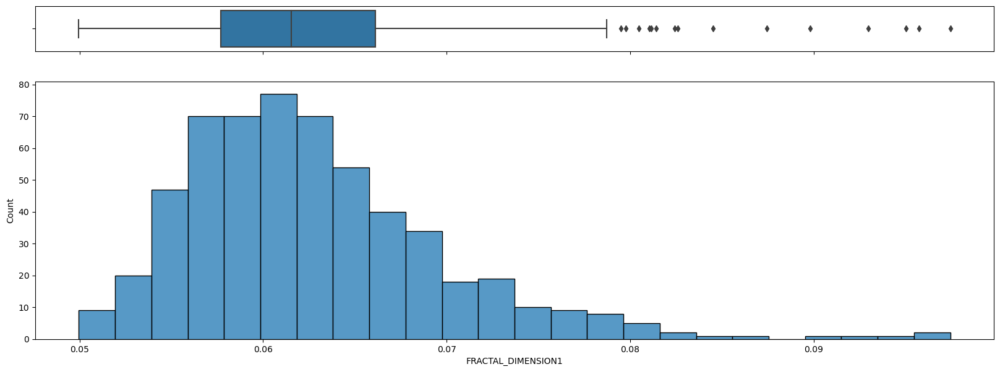

---

## *RADIUS2 - numeric*

,
Number of unique values,540
Sum,230.54
Mean,0.41
Mode,0.22
Standard deviation,0.28
Mean absolute deviation,0.19
Median absolute deviation,0.16
Coefficient of variation,0.68
Kurtosis,17.52
Skewness,3.08


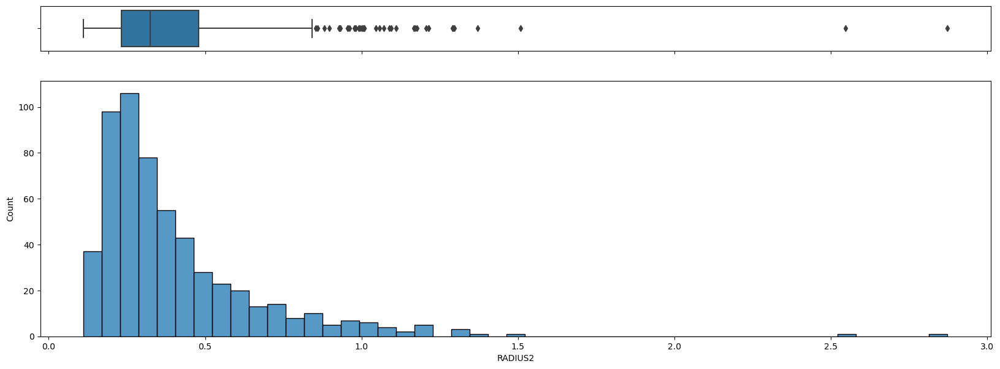

---

## *TEXTURE2 - numeric*

,
Number of unique values,519
Sum,692.39
Mean,1.22
Mode,0.86
Standard deviation,0.55
Mean absolute deviation,0.41
Median absolute deviation,0.32
Coefficient of variation,0.45
Kurtosis,5.29
Skewness,1.64


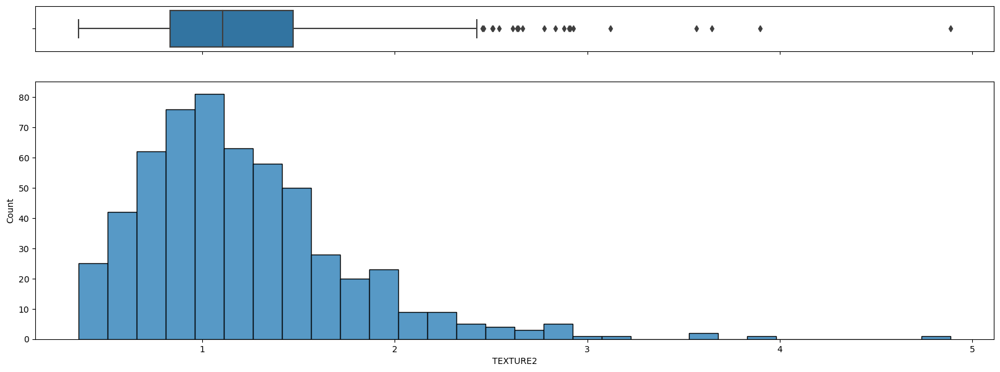

---

## *PERIMETER2 - numeric*

,
Number of unique values,533
Sum,1 630.79
Mean,2.87
Mode,1.78
Standard deviation,2.02
Mean absolute deviation,1.33
Median absolute deviation,1.08
Coefficient of variation,0.71
Kurtosis,21.20
Skewness,3.43


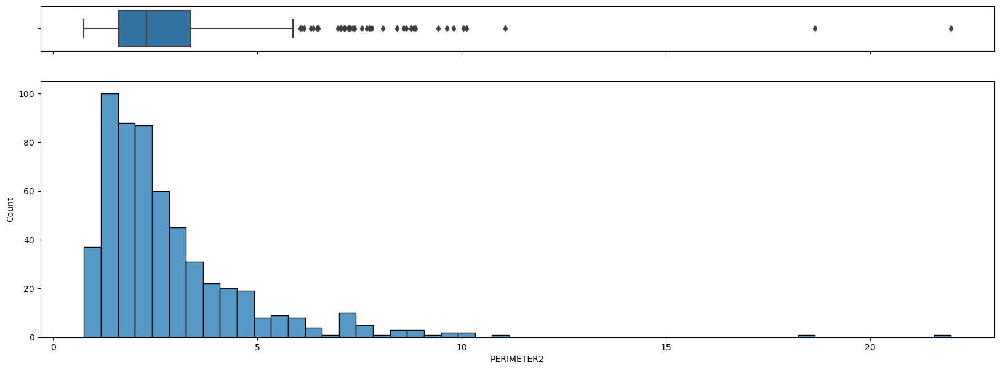

---

## *AREA2 - numeric*

,
Number of unique values,528
Sum,22 951.80
Mean,40.34
Mode,16.64
Standard deviation,45.49
Mean absolute deviation,27.20
Median absolute deviation,20.81
Coefficient of variation,1.13
Kurtosis,48.77
Skewness,5.43


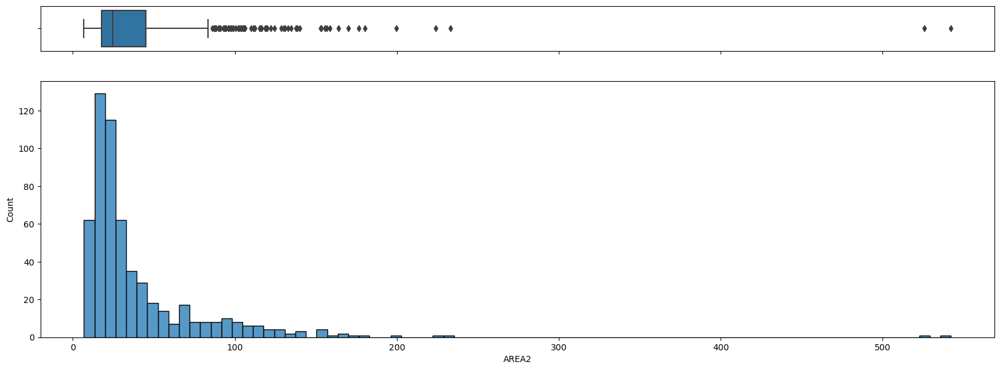

---

## *SMOOTHNESS2 - numeric*

,
Number of unique values,547
Sum,4.01
Mean,0.01
Mode,0.01
Standard deviation,0.00
Mean absolute deviation,0.00
Median absolute deviation,0.00
Coefficient of variation,0.43
Kurtosis,10.37
Skewness,2.31


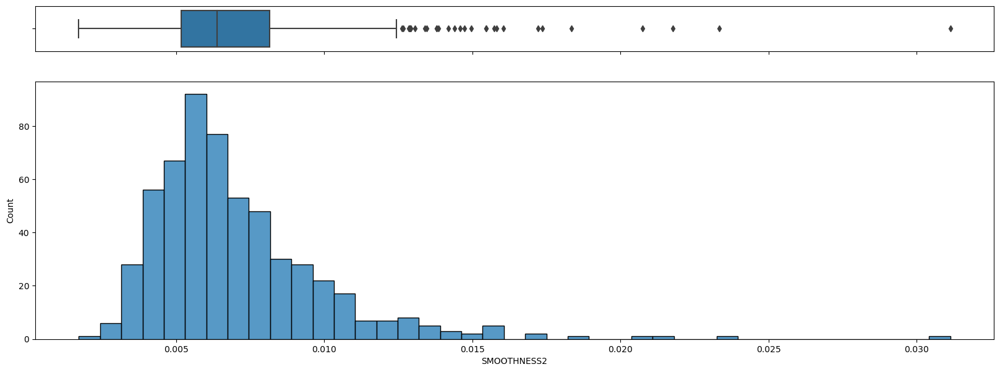

---

## *COMPACTNESS2 - numeric*

,
Number of unique values,541
Sum,14.50
Mean,0.03
Mode,0.01
Standard deviation,0.02
Mean absolute deviation,0.01
Median absolute deviation,0.01
Coefficient of variation,0.70
Kurtosis,5.05
Skewness,1.90


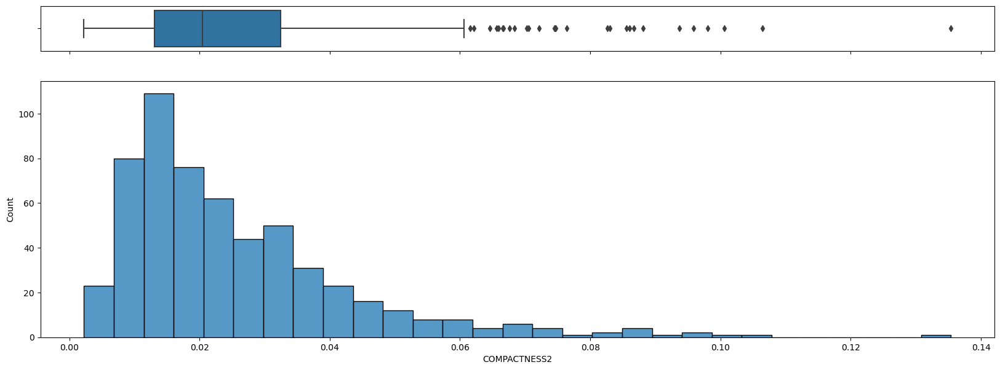

---

## *CONCAVITY2 - numeric*

,
Number of unique values,533
Sum,18.15
Mean,0.03
Mode,0.0
Standard deviation,0.03
Mean absolute deviation,0.02
Median absolute deviation,0.01
Coefficient of variation,0.95
Kurtosis,48.42
Skewness,5.10


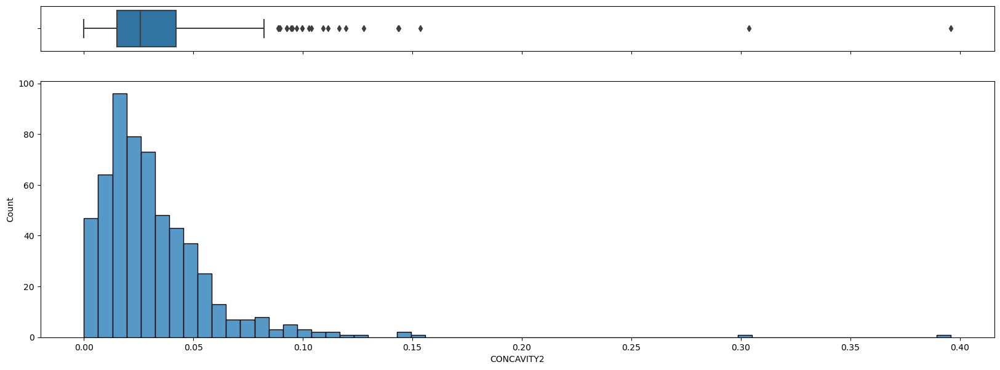

---

## *CONCAVE_POINTS2 - numeric*

,
Number of unique values,507
Sum,6.71
Mean,0.01
Mode,0.0
Standard deviation,0.01
Mean absolute deviation,0.00
Median absolute deviation,0.00
Coefficient of variation,0.52
Kurtosis,5.07
Skewness,1.44


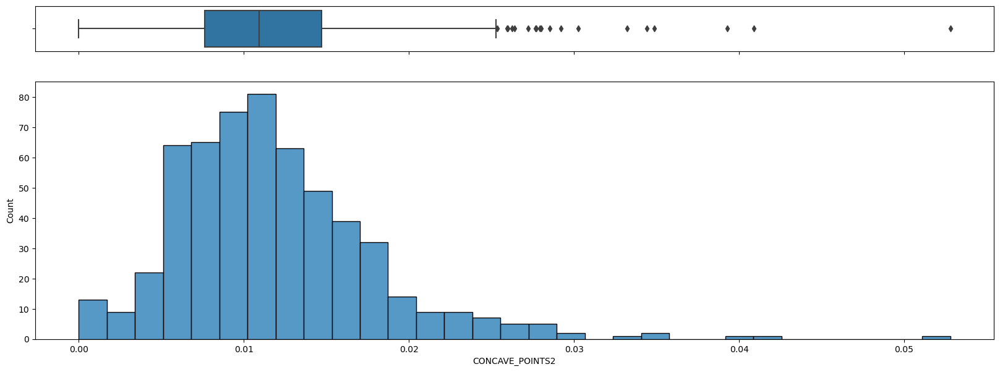

---

## *SYMMETRY2 - numeric*

,
Number of unique values,498
Sum,11.69
Mean,0.02
Mode,0.01
Standard deviation,0.01
Mean absolute deviation,0.01
Median absolute deviation,0.00
Coefficient of variation,0.40
Kurtosis,7.82
Skewness,2.19


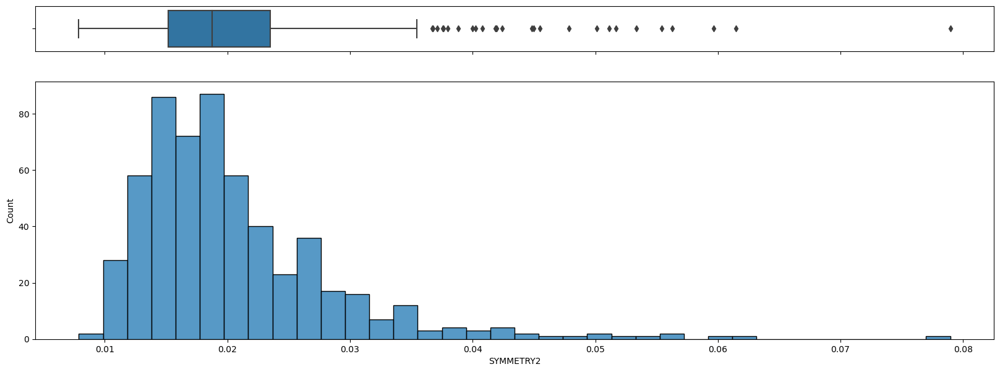

---

## *FRACTAL_DIMENSION2 - numeric*

,
Number of unique values,545
Sum,2.16
Mean,0.00
Mode,0.00
Standard deviation,0.00
Mean absolute deviation,0.00
Median absolute deviation,0.00
Coefficient of variation,0.70
Kurtosis,26.04
Skewness,3.91


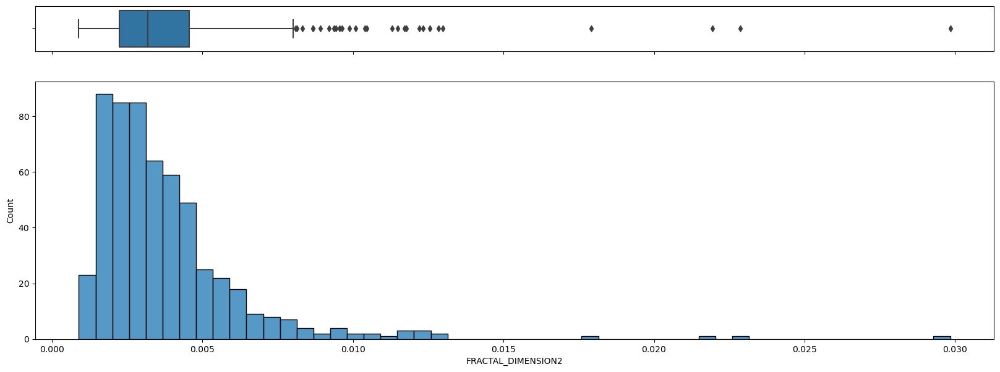

---

## *RADIUS3 - numeric*

,
Number of unique values,457
Sum,9 257.17
Mean,16.27
Mode,12.36
Standard deviation,4.83
Mean absolute deviation,3.79
Median absolute deviation,3.18
Coefficient of variation,0.30
Kurtosis,0.93
Skewness,1.10


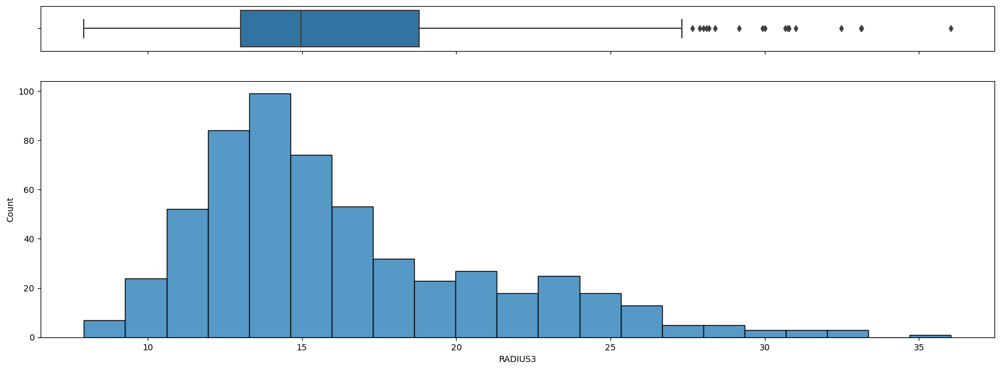

---

## *TEXTURE3 - numeric*

,
Number of unique values,511
Sum,14 610.34
Mean,25.68
Mode,17.70
Standard deviation,6.15
Mean absolute deviation,4.91
Median absolute deviation,4.36
Coefficient of variation,0.24
Kurtosis,0.21
Skewness,0.50


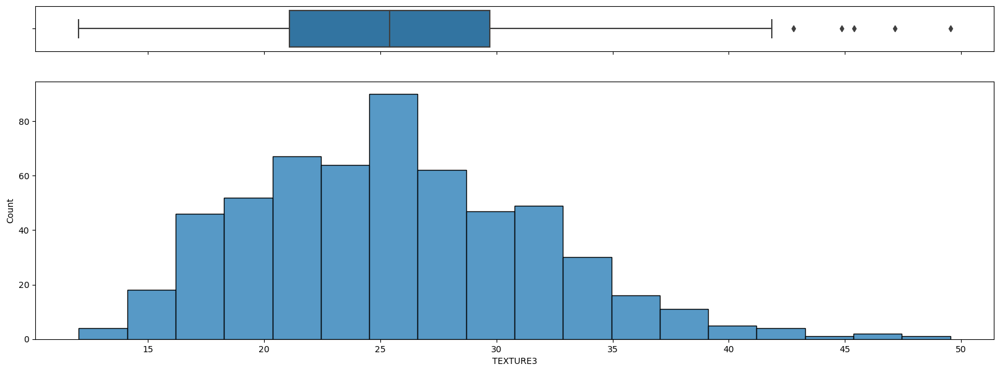

---

## *PERIMETER3 - numeric*

,
Number of unique values,514
Sum,61 031.63
Mean,107.26
Mode,101.70
Standard deviation,33.60
Mean absolute deviation,26.47
Median absolute deviation,22.13
Coefficient of variation,0.31
Kurtosis,1.05
Skewness,1.13


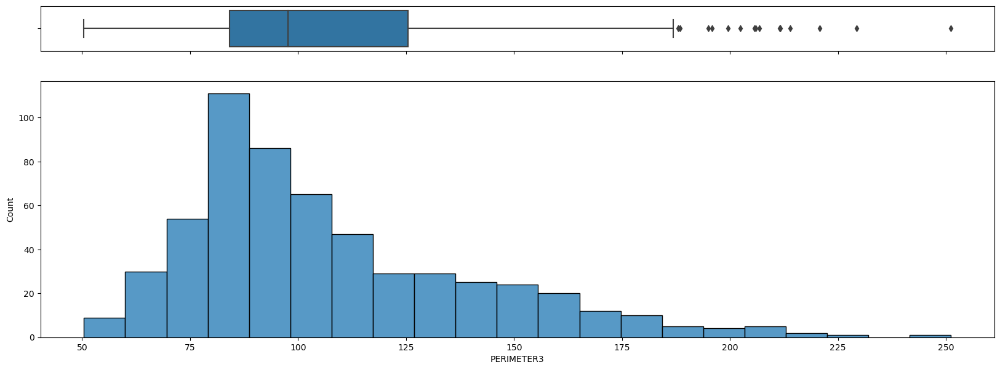

---

## *AREA3 - numeric*

,
Number of unique values,544
Sum,501 051.80
Mean,880.58
Mode,284.40
Standard deviation,569.36
Mean absolute deviation,423.88
Median absolute deviation,348.42
Coefficient of variation,0.65
Kurtosis,4.35
Skewness,1.85


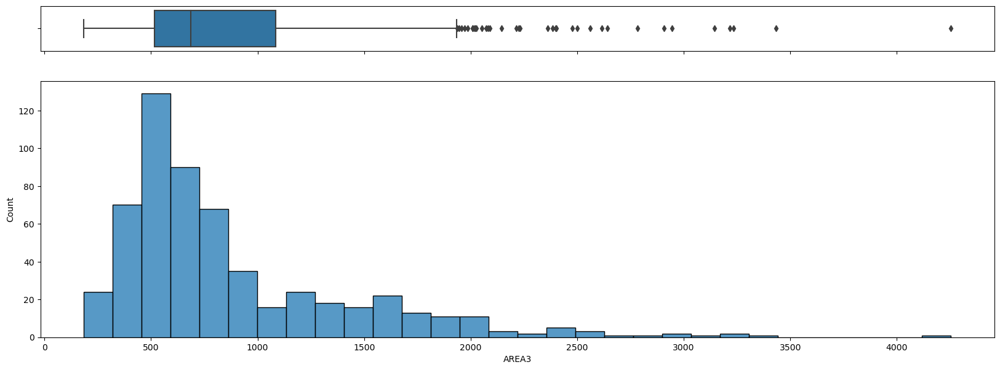

---

## *SMOOTHNESS3 - numeric*

,
Number of unique values,411
Sum,75.32
Mean,0.13
Mode,0.12
Standard deviation,0.02
Mean absolute deviation,0.02
Median absolute deviation,0.01
Coefficient of variation,0.17
Kurtosis,0.50
Skewness,0.41


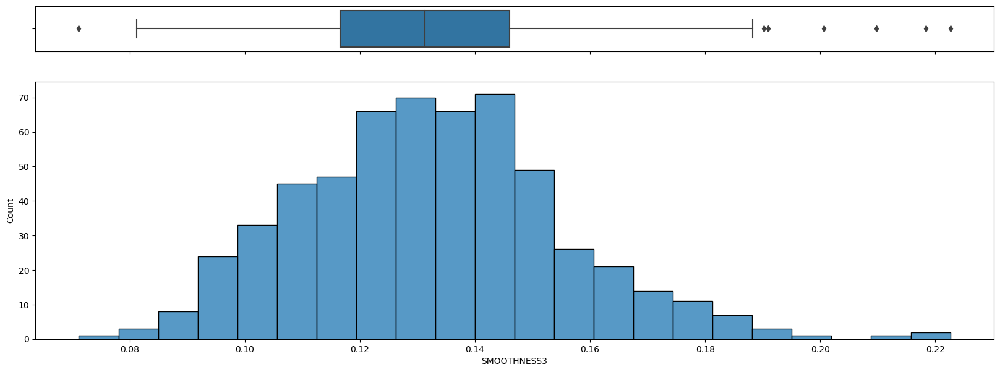

---

## *COMPACTNESS3 - numeric*

,
Number of unique values,529
Sum,144.68
Mean,0.25
Mode,0.15
Standard deviation,0.16
Mean absolute deviation,0.12
Median absolute deviation,0.10
Coefficient of variation,0.62
Kurtosis,3.00
Skewness,1.47


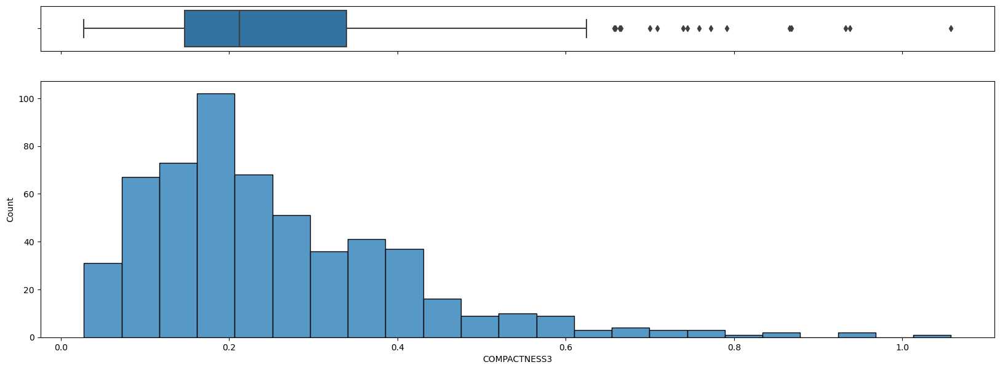

---

## *CONCAVITY3 - numeric*

,
Number of unique values,539
Sum,154.88
Mean,0.27
Mode,0.0
Standard deviation,0.21
Mean absolute deviation,0.16
Median absolute deviation,0.14
Coefficient of variation,0.77
Kurtosis,1.59
Skewness,1.15


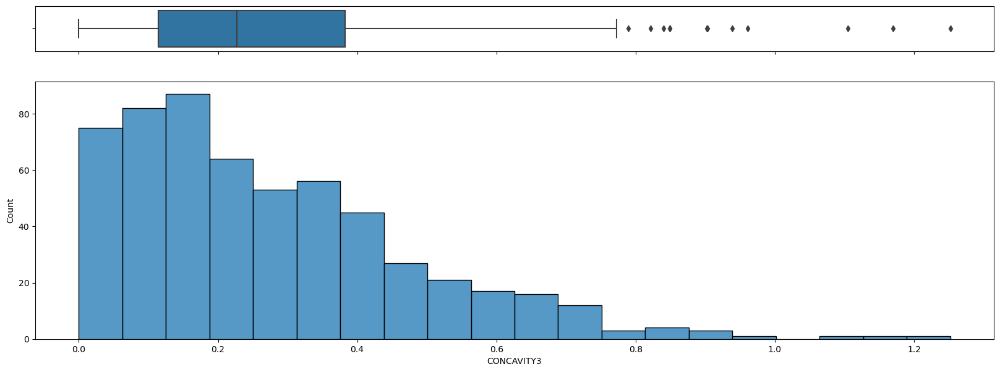

---

## *CONCAVE_POINTS3 - numeric*

,
Number of unique values,492
Sum,65.21
Mean,0.11
Mode,0.0
Standard deviation,0.07
Mean absolute deviation,0.05
Median absolute deviation,0.05
Coefficient of variation,0.57
Kurtosis,-0.54
Skewness,0.49


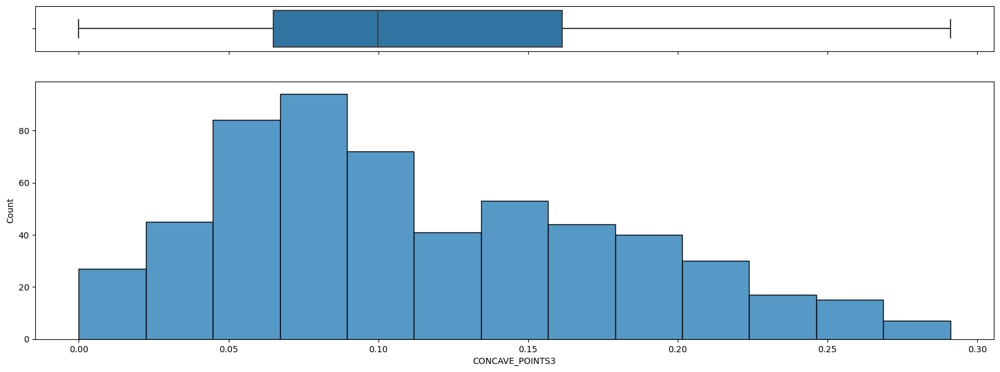

---

## *SYMMETRY3 - numeric*

,
Number of unique values,500
Sum,165.05
Mean,0.29
Mode,0.22
Standard deviation,0.06
Mean absolute deviation,0.04
Median absolute deviation,0.03
Coefficient of variation,0.21
Kurtosis,4.40
Skewness,1.43


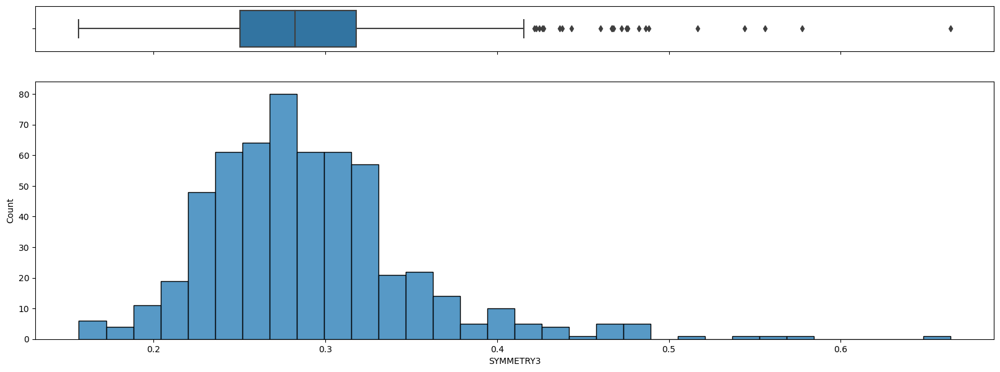

---

## *FRACTAL_DIMENSION3 - numeric*

,
Number of unique values,535
Sum,47.77
Mean,0.08
Mode,0.07
Standard deviation,0.02
Mean absolute deviation,0.01
Median absolute deviation,0.01
Coefficient of variation,0.22
Kurtosis,5.19
Skewness,1.66


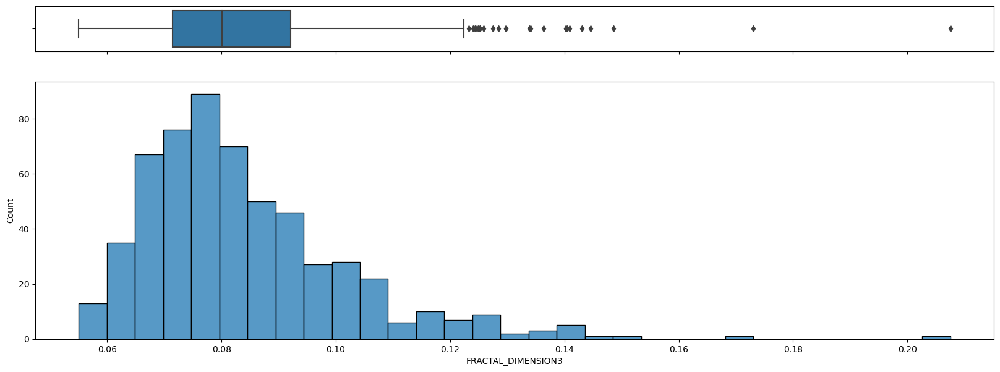

---

# Bivariate analysis<a id='be20bf74-0728-4527-842d-774534be6652'>
---

## Correlation Plot<a id='73c7113e-bbcf-4f28-a28d-792f3cd5e5c5'>

### Pearson Correlation

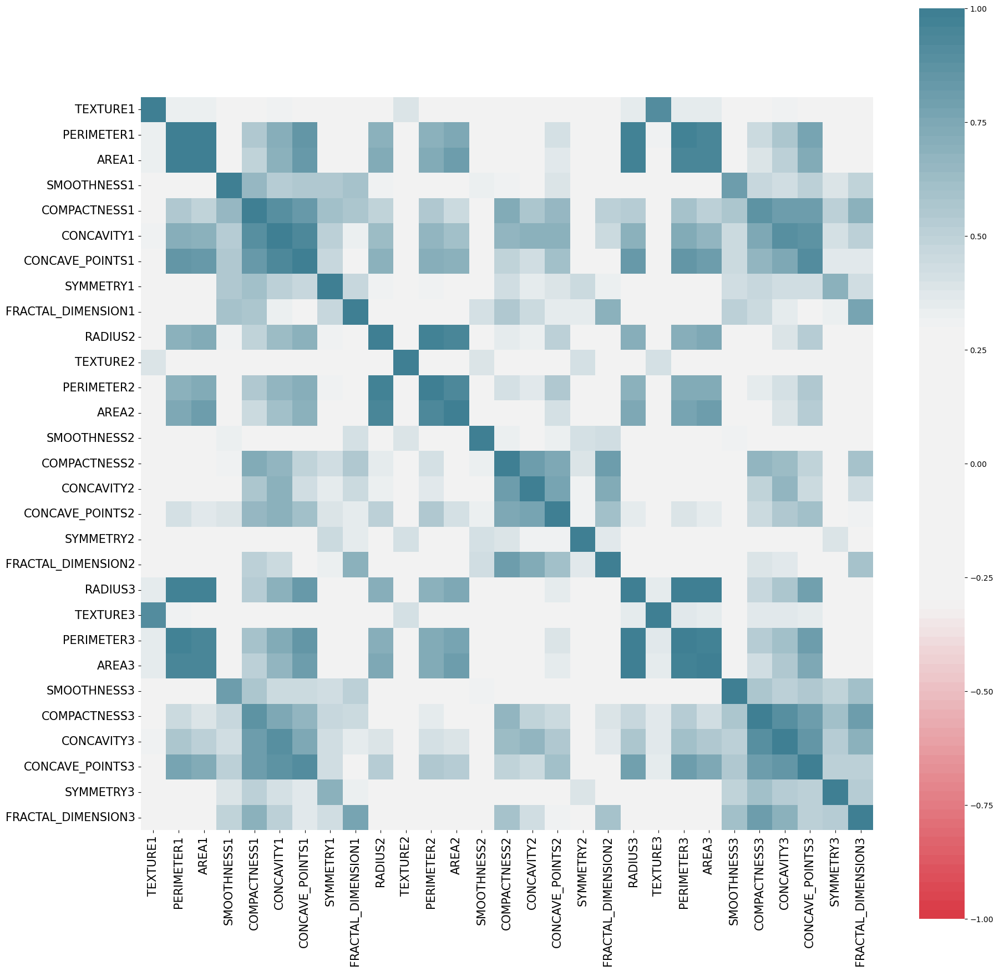

### Spearman Correlation

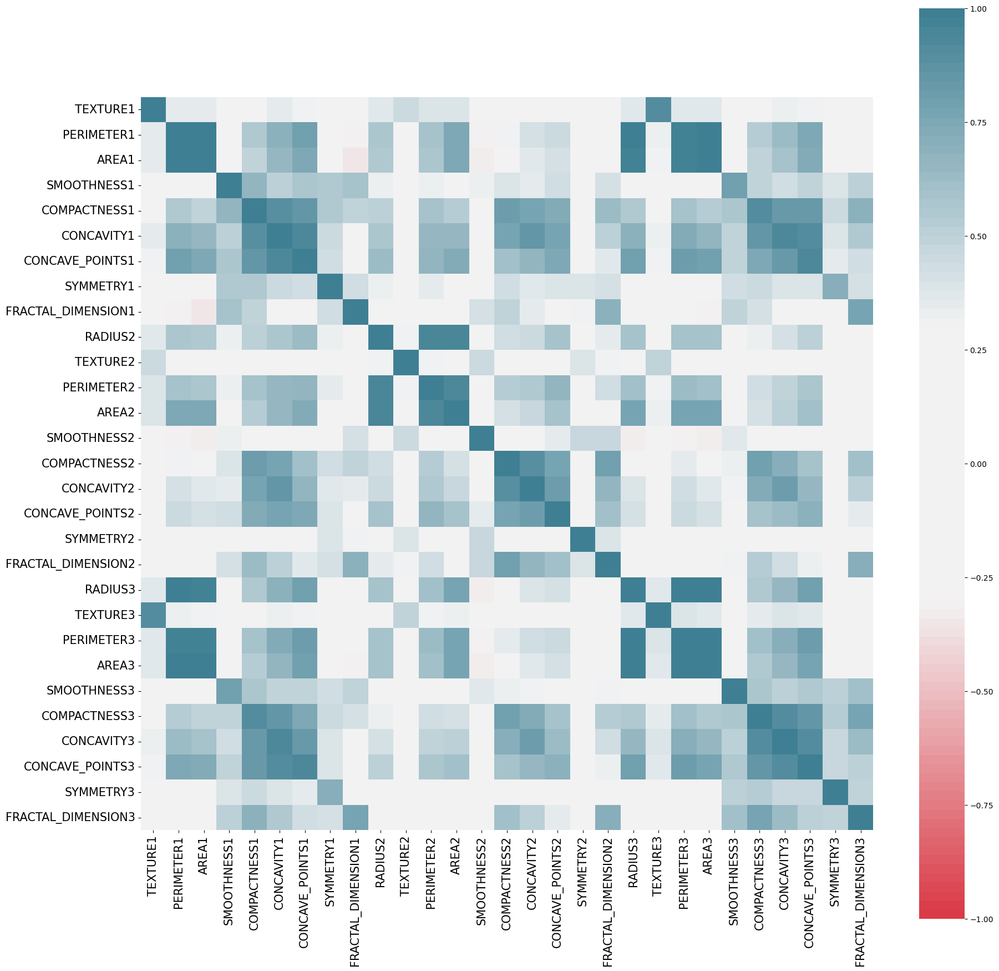

### Kendall Correlation

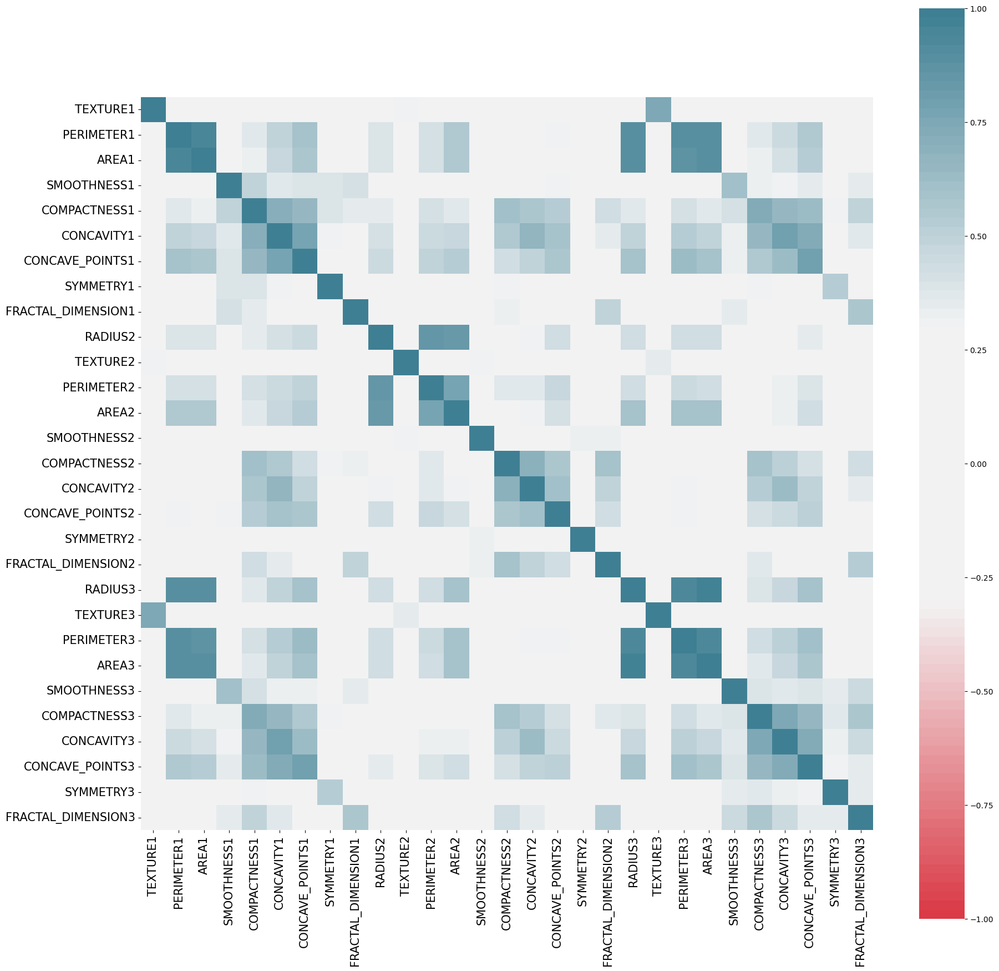

## Pairplot<a id='bfb376ae-e052-4eb6-8250-881c185ded13'>

/Users/krishnadave/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/krishnadave/anaconda3/lib/python3.11/site-packages/edvart/report_sections/bivariate_analysis.py:728: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


## Contingency table<a id='3923b779-cbfa-4943-afb5-b76416c5a663'>

# Multivariate analysis<a id='2b893847-c50d-433b-b5ba-8c45b36761c8'>
---

## Principal Component Analysis<a id='7d710b88-a4da-4d91-aa2a-5ccc317dfebe'>

### First vs second principal component

Explained variance ratio: 62.18%


### Explained variance ratio

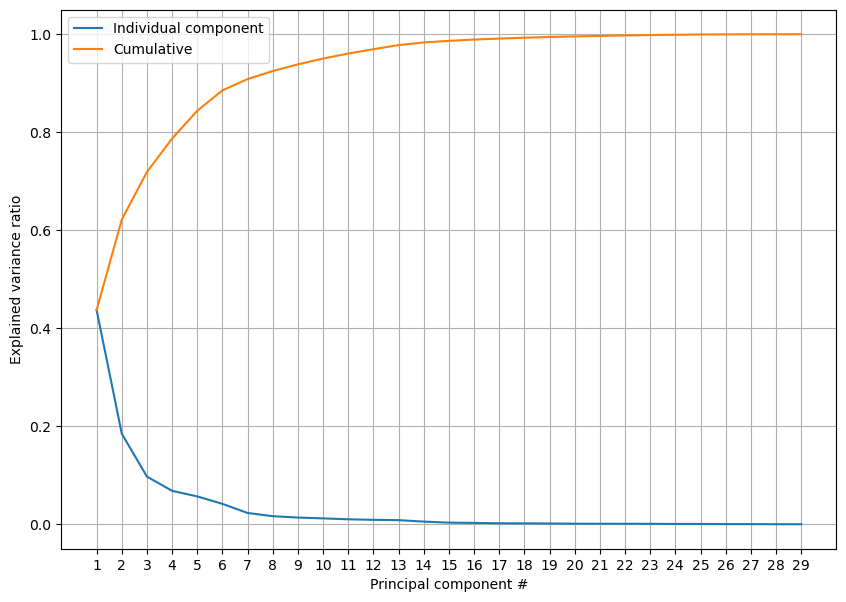

## Parallel coordinates<a id='dc917f13-ccd7-41c6-bb79-c1b411628adf'>

## Parallel categories<a id='298e7848-5c30-404e-a667-dd8dc23a9aad'>

INFO:edvart.report.DefaultReport:Exporting report to HTML requires generating and executing a notebook, which may take some time.


In [12]:
createEDAReport(breastCancerData_real)